<a href="https://colab.research.google.com/github/wanasyraf4/BernasControlPanel/blob/main/BernasControlPanel.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!curl https://colab.chainer.org/install | sh -
!pip install cucim
!pip install scipy scikit-image cupy-cuda100

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  1580  100  1580    0     0  11048      0 --:--:-- --:--:-- --:--:-- 11048
********************************************************************************
GPU is not enabled!
Open "Runtime" > "Change runtime type" and set "Hardware accelerator" to "GPU".
********************************************************************************
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 8.4 MB 6.1 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 58.9 MB 80 kB/s 


In [ ]:
import numpy as np
import cv2
import plotly.express as px
import cupy as cp
import cucim
from skimage.io import imread, imshow
import pandas as pd
import matplotlib.pyplot as plt

from google.colab import drive

drive.mount('/content/drive/')

path = "/content/drive/My Drive/Colab Notebooks/ImageDataset/IMG_2801.jpg"

Mounted at /content/drive/



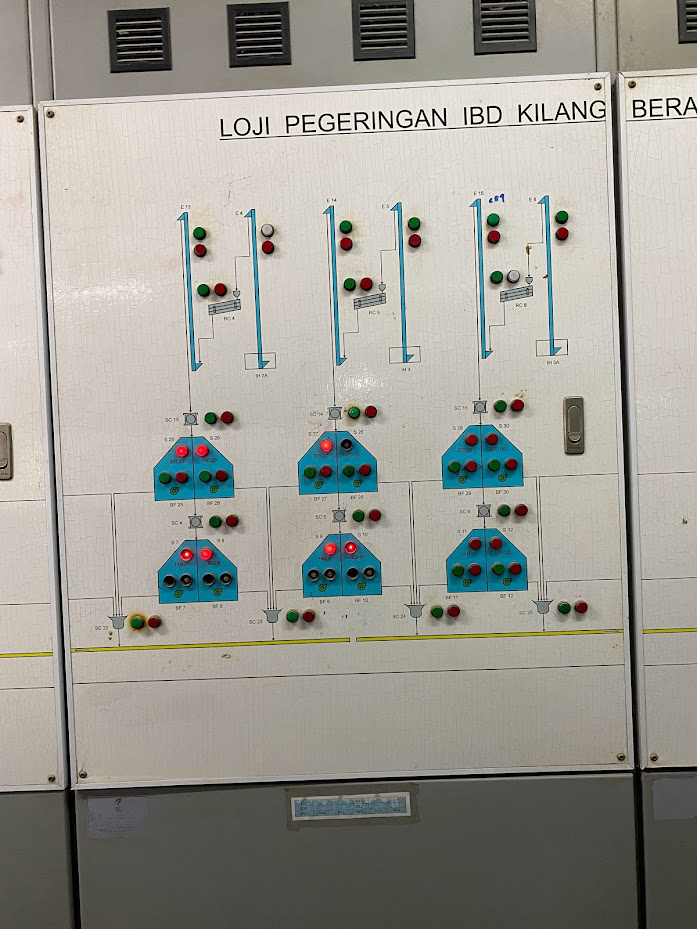

In [ ]:
image = imread(path)

px.imshow(image)


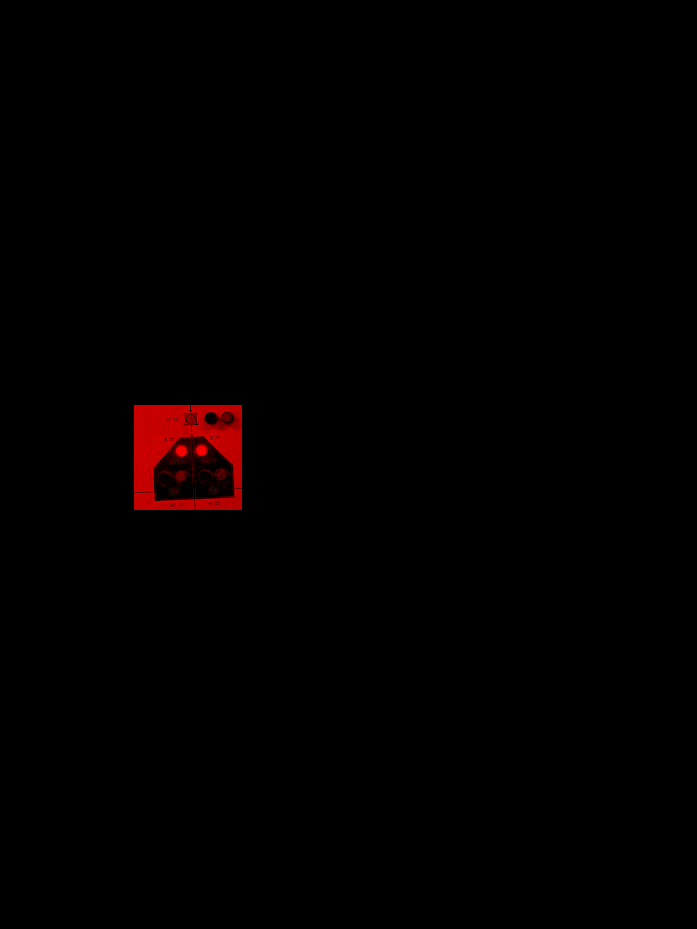

In [ ]:
height, width= image.shape[:2]
ROI= np.array([[(134,509),(134,405),(241,405),(241,509)]], dtype= np.int32)
# ROI= np.array([[(0,900),(0,0),(600,0),(600,900)]], dtype= np.int32)
blank= np.zeros_like(image)

roi_gs= cv2.fillPoly(blank, ROI,255)

roi_img= cv2.bitwise_and(image, roi_gs)


px.imshow( roi_img)

In [ ]:
gs = cv2.cvtColor(roi_img, cv2.COLOR_BGR2GRAY)
gs = cv2.bitwise_not(gs)
px.imshow(gs)


In [ ]:

mask = np.full(gs.shape,255)

hessian= mask - gs
hessian = hessian.astype(np.uint8)

px.imshow(hessian)


In [ ]:
print(np.mean(hessian))

0.2594573390804509


In [ ]:
Fc = 25
# Fc = np.mean(gs)+ (0.1)*np.std(gs)
(thresh, bw) = cv2.threshold(hessian, Fc, 255, cv2.THRESH_BINARY)
px.imshow(bw)

In [ ]:
from scipy import ndimage
bw = ndimage.median_filter(bw, 4)
px.imshow(bw)

In [ ]:
strel = np.ones((4,4),np.uint8)
# opening = cv2.getStructuringElement( cv2.MORPH_ELLIPSE,strel)
ellip = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(7,7))
# print(cv2.MORPH_OPEN)
result = cv2.morphologyEx(bw, cv2.MORPH_OPEN, ellip)
px.imshow(result)

In [ ]:
canny = cv2.Canny(bw, 30, 150, 3)
px.imshow(canny)

In [ ]:
dilated = cv2.dilate(canny, (1,1), iterations = 3)
px.imshow(dilated)


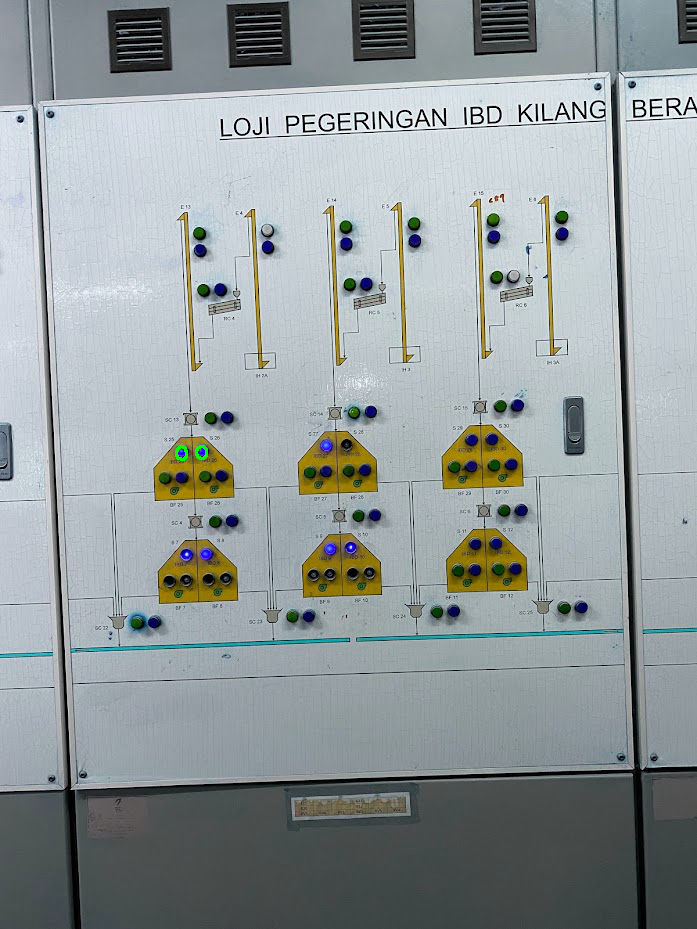

In [ ]:
(cnt, hierarchy) = cv2.findContours(dilated.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
cv2.drawContours(rgb, cnt, -1, (0,255,0),2)
px.imshow(rgb)

In [ ]:
b = len(cnt)

In [ ]:
a = 0
if b > a:
  print("IBD1 ON")

IBD1 ON


In [ ]:
from skimage import measure
all_labels = measure.label(result)
px.imshow(all_labels)

In [ ]:
im = all_labels

In [ ]:
from skimage import segmentation
from scipy import ndimage as ndi
from scipy import ndimage
from skimage.feature import peak_local_max
from skimage.segmentation import watershed

distance = ndi.distance_transform_edt(result)
coords = peak_local_max(distance, footprint=np.ones((3, 3)), labels=result)
mask = np.zeros(distance.shape, dtype=bool)
mask[tuple(coords.T)] = True
markers, _ = ndi.label(mask)
labels = watershed(-distance, markers, mask=result)

px.imshow(labels)

In [ ]:
x = im.flatten()

In [ ]:
get_indexes = lambda x, xs: [i for (y, i) in zip(xs, range(len(xs))) if x == y]
no_ibd =(get_indexes(3,x))
ibd1 =(get_indexes(2,x))
ibd2 =(get_indexes(1,x))

In [ ]:
no_ibd = bool(no_ibd)
ibd1 = bool(ibd1)
ibd2 = bool(ibd2)

In [ ]:
if ibd1 and ibd2 == True:
  print("all IBD ON")
elif ibd1 == True:
  print("IBD1 ON")
elif ibd2 == True:
  print("IBD2 ON")
else:
  print("IBD all OFF")

all IBD ON
